# Comparação: Modelos Pré-Treinados vs. Modelos Treinados do Zero

Este notebook treina modelos com codificadores pré-treinados (VGG-16, ResNet-50), importa os modelos já treinados no notebook '02-improved-models.ipynb'e compara o desempenho de todos els no mesmo conjunto de teste.

# Imports e Setup

In [4]:
import torch
from torch import nn as nn
import math
from glob import glob
#from torchsummary import summary
from torchinfo import summary
from torch_snippets import *
from torch_snippets.torch_loader import Report
from torch.utils.data import TensorDataset, DataLoader
from torchvision import transforms, models
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sklearn.metrics import cohen_kappa_score
from sklearn.model_selection import train_test_split
import os
import warnings
from collections import defaultdict, OrderedDict
from larvae_utils import *
import time

In [5]:
warnings.filterwarnings("ignore")

gpu = torch.backends.mps.is_available()
device = torch.device('mps') if gpu else torch.device('cpu')
print('Usando device:', device)

Usando device: mps


# Dataset e DataLoaders

In [6]:
import pickle

# Carregar os datasets e labels dos arquivos .pkl
with open('datasets/trainset.pkl', 'rb') as f:
    train_data = pickle.load(f)
    trainset, train_labels = train_data['data'], train_data['labels']

with open('datasets/validset.pkl', 'rb') as f:
    valid_data = pickle.load(f)
    validset, valid_labels = valid_data['data'], valid_data['labels']

with open('datasets/testset.pkl', 'rb') as f:
    test_data = pickle.load(f)
    testset, test_labels = test_data['data'], test_data['labels']

print(f"Trainset: {len(trainset)} imagens")
print(f"Validset: {len(validset)} imagens")
print(f"Testset: {len(testset)} imagens")

Trainset: 799 imagens
Validset: 319 imagens
Testset: 480 imagens


In [7]:
orig_dir = '../../figures-datasets/images/larvae'  # changing for larvae folder
nclasses = 2

# Set the desired image size for rescaling and maximum value for normalization
# using the same size as the corel version
width = 224
height = 224
nchannels = 3
maxval = 255
input_shape = (nchannels, height, width)

# get the list of images in the original folder
data = glob(orig_dir+"/*.png")  # it returns a list of image filenames

In [8]:
print("Trainset:")
check_targets(trainset)
print("Validset:")
check_targets(validset)
print("Testset:")
check_targets(testset)

Trainset:
Total: 799
Targets: 124
Não Targets: 675
Proporção: 0.15519399249061328
Validset:
Total: 319
Targets: 49
Não Targets: 270
Proporção: 0.1536050156739812
Testset:
Total: 480
Targets: 74
Não Targets: 406
Proporção: 0.15416666666666667


In [9]:
# checando proporção de treino, validação e teste
len(trainset)/len(data), len(validset)/len(data), len(testset)/len(data)

(0.5, 0.19962453066332916, 0.30037546933667086)

In [10]:
# Regular preprocessing transformation. The input is a PIL image, which after being resized,
# it is converted into a tensor for normalization using the ImageNet mean and stdev parameters.
prep = transforms.Compose([
    transforms.Resize(
        (224, 224),
        interpolation=transforms.InterpolationMode.BILINEAR,
        max_size=None, antialias=True
    ),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])


# Data augmentation
aug = transforms.Compose([
    transforms.Resize(
        (300, 300), 
        interpolation=transforms.InterpolationMode.BILINEAR,
        max_size=None, antialias=True
    ),
    transforms.RandomAffine(
        degrees=10,             
        translate=(0.05, 0.10), 
        scale=(0.9, 1.1),       
        shear=(-2, 2),          
        interpolation=transforms.InterpolationMode.BILINEAR,  
        fill=0                  
    ),
    transforms.CenterCrop(250),
    transforms.Resize(
        (224, 224), 
        interpolation=transforms.InterpolationMode.BILINEAR,
        max_size=None, antialias=True
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225)
    )
])

# Create an image dataset by applying one of the preprocessing transformations above
class ImageDataset():  
    def __init__(self, dataset, transform=None):
        # it gets the image true labels and set the preprocessing transformation
        self.dataset = dataset
        self.targets = [int(str(x).split("/")[-1].split("_")[0])-1 for x in self.dataset] # 0 for larvae, 1 for non-larvae
        self.transform = transform

    def __len__(self): return len(self.dataset)

    def __getitem__(self, ix):  # returns the item at position ix
        filename = self.dataset[ix]
        target = self.targets[ix]
        image = Image.open(filename)  # It is a PIL image
        if (self.transform is not None):
            image = self.transform(image)
        else:  # just reshape the image as a tensor with nchannels, height, width
            image = torch.from_numpy(np.array(image)).permute(2, 0, 1).float()
            
        return (image, target)

In [11]:
trainset_ = trainset.copy()
validset_ = validset.copy()
testset_ = testset.copy()
trainset = ImageDataset(trainset_, aug)
validset = ImageDataset(validset, prep)
testset = ImageDataset(testset, prep)

# no trainset aplicamos data augmentation (aug)
# no validset e testset aplicamos apenas a normalização (prep)

In [12]:
from torch.utils.data import WeightedRandomSampler

labels_train = [1 if "000001_" in str(x) else 0 for x in trainset_]
class_sample_count = np.array([len(np.where(np.array(labels_train)==t)[0]) for t in np.unique(labels_train)])
weights = 1. / class_sample_count
samples_weights = np.array([weights[t] for t in labels_train])
sampler = WeightedRandomSampler(samples_weights, len(samples_weights), replacement=True)

batchsize = 32  # batch size = numero de imagens por lote
trainload = DataLoader(trainset, batch_size=batchsize, sampler=sampler) # tive que balancear o treino, pois nao estava convergindo
testload = DataLoader(testset, batch_size=batchsize, shuffle=True)
validload = DataLoader(validset, batch_size=batchsize, shuffle=True)

next(iter(trainload))  # inspect next item in the trainload

[tensor([[[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           ...,
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],
 
          [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           ...,
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],
 
          [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
           [-

# Create and Train Pretaned Models

## VGG16

In [13]:
# definindo critério 
weight_decay = 1e-3

def Criterion(model, preds, targets):
    # compute cross entropy loss
    ce = nn.CrossEntropyLoss().to(device)
    loss = ce(preds, targets.long())

    # add l2_regularization
    l2_regularization = 0
    for param in model.parameters():
        l2_regularization += torch.norm(param, 2)
    loss += weight_decay*l2_regularization  #  weight_decay

    # compute mean accuracy and kappa in the batch
    pred_labels = torch.max(preds, 1)[1]  # same as argmax
    acc = torch.sum(pred_labels == targets.data)
    n = pred_labels.size(0)
    acc = acc/n
    kappa = cohen_kappa_score(pred_labels.cpu().numpy(),targets.data.cpu().numpy())
    return loss, acc, kappa

criterion = Criterion

In [14]:
# definindo early stopping baseado no kappa
# evitar overfitting 
class EarlyStoppingKappa:
    def __init__(self, patience=3, min_delta=0.02):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_kappa = None
        self.early_stop = False

    def __call__(self, val_kappa):
        if self.best_kappa is None:
            self.best_kappa = val_kappa
        elif val_kappa < self.best_kappa + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_kappa = val_kappa
            self.counter = 0

# usar no treinamento 
early_stopping = EarlyStoppingKappa(patience=2, min_delta=0.02)

### Create model

In [21]:
# definindo rede com VGG16
def LarvaeVGG16(nclasses):
    # get the vgg16 model pretrained on ImageNet
    model = models.vgg16(weights='IMAGENET1K_V1')
    # Specify you do not want to train the parameters of the model
    for param in model.parameters():
        param.requires_grad = False
    # The vgg16 model consists of three modules: features, avgpool, and classifier. 

    # Change avgpool to return a feature map of size 1x1 instead of 7x7. This will create
    # batches with 512x1x1 tensors. 
    model.avgpool = nn.AdaptiveAvgPool2d(output_size=(1,1))
    # Change the classifier to one suitable for your dataset
    model.classifier = nn.Sequential(nn.Flatten(), \
                                     nn.Linear(512,128), \
                                     nn.ReLU(), \
                                     nn.Dropout(0.5), 
                                     nn.Linear(128, nclasses) \
                                    ) # you do not need nn.Softmax() in torch
    criterion = Criterion    
    optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)
    # Return the complete model information for training and evaluation
    return(model.to(device), criterion, optimizer)

model_vgg, criterion_vgg, optimizer_vgg = LarvaeVGG16(nclasses)  # get the model

In [22]:
summary(model_vgg)  # print the model summary

Layer (type:depth-idx)                   Param #
VGG                                      --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       (1,792)
│    └─ReLU: 2-2                         --
│    └─Conv2d: 2-3                       (36,928)
│    └─ReLU: 2-4                         --
│    └─MaxPool2d: 2-5                    --
│    └─Conv2d: 2-6                       (73,856)
│    └─ReLU: 2-7                         --
│    └─Conv2d: 2-8                       (147,584)
│    └─ReLU: 2-9                         --
│    └─MaxPool2d: 2-10                   --
│    └─Conv2d: 2-11                      (295,168)
│    └─ReLU: 2-12                        --
│    └─Conv2d: 2-13                      (590,080)
│    └─ReLU: 2-14                        --
│    └─Conv2d: 2-15                      (590,080)
│    └─ReLU: 2-16                        --
│    └─MaxPool2d: 2-17                   --
│    └─Conv2d: 2-18                      (1,180,160)
│    └─ReLU: 2-19

### Train and evaluate model

In [23]:
# clean up memory if needed
import gc

gc.collect()
torch.mps.empty_cache()

In [24]:
# train and validate bacth functions defined in larvae_utils.py
# initializing variables
n_epochs = 10
log = Report(n_epochs)
model = model_vgg.to(device)  # moving model to device
optimizer = optimizer_vgg
criterion = criterion_vgg

#lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# starting training and validation
start_time = time.time()
for ex in range(n_epochs):
    N = len(trainload)
    for bx, data in enumerate(trainload):
        loss, acc, kappa = train_batch(model, data, optimizer, criterion, device)
        # report results for the batch
        log.record((ex+(bx+1)/N), trn_loss=loss, trn_acc=acc, trn_kappa=kappa, end='\r')

    N = len(validload)
    for bx, data in enumerate(validload):
        loss, acc, kappa = validate_batch(model, data, criterion, device)
        log.record((ex+(bx+1)/N), val_loss=loss, val_acc=acc, val_kappa=kappa, end='\r')

    if (ex+1) % 10 == 0: 
        log.report_avgs(ex+1)

    # count epochs for auto-adjusting the learning rate
    #lr_scheduler.step()  # lr decay

    # early stopping
    #epoch_val_kappa = np.mean(log.val_kappa)  # mean kappa for the epoch
    #early_stopping(epoch_val_kappa)
    #if early_stopping.early_stop:
    #    print("Early stopping at epoch", ex+1)
    #    break

training_time = time.time() - start_time

EPOCH: 10.000  trn_kappa: 0.844  trn_acc: 0.925  val_loss: 0.475  trn_loss: 0.493  val_acc: 0.928  val_kappa: 0.697  (142.71s - 0.00s remaining)


100%|██████████| 111/111 [00:00<00:00, 42909.47it/s]


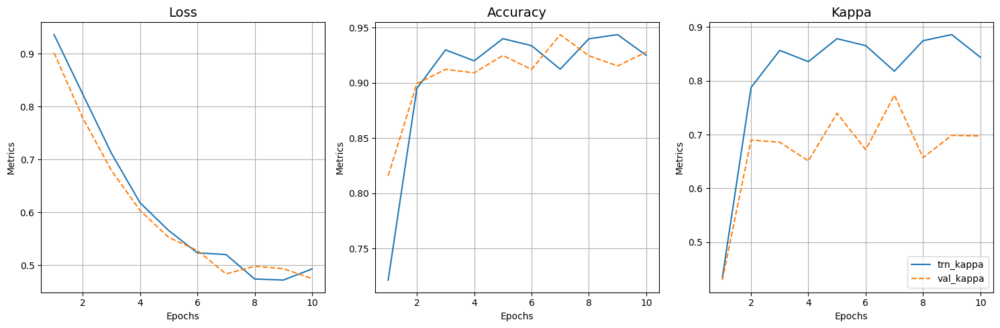

In [25]:
plot_results(log)  # plot results

In [26]:
# evalueate the model on the testset
results_pretained = []
trained_logs = {}
trained_models = {}

# Test defined in larvae_utils.py
model_name = 'VGG16'
(loss, acc, kappa) = Test(model, testload, criterion, device)

results_vgg = {
    'model': model_name,
    'test_loss': loss,
    'test_accuracy': acc,
    'test_kappa': kappa,
    'training_time': training_time,
    'total_parameters': sum(p.numel() for p in model.parameters() if p.requires_grad)
}

results_pretained.append(results_vgg)
trained_logs[model_name] = log
trained_models[model_name] = model

results_vgg

{'model': 'VGG16',
 'test_loss': 0.4757297654946645,
 'test_accuracy': 0.925,
 'test_kappa': np.float64(0.7500900273405603),
 'training_time': 142.7095170021057,
 'total_parameters': 65922}

In [58]:
# save model
torch.save(trained_models['VGG16'].state_dict(), f'trained_models/VGG16_pretained.pth')

## ResNet50

In [28]:
# definindo rede com ResNet50
def LarvaeResNet50(nclasses):
    # get the vgg16 model pretrained on ImageNet
    model = models.resnet50(weights='IMAGENET1K_V1')
    # Specify you do not want to train the parameters of the model
    for param in model.parameters():
        param.requires_grad = False
    
    # The resnet50 model consists of three modules: features, avgpool, and classifier. 
    # Change avgpool to return a feature map of size 1x1 instead of 7x7. This will create
    # batches with 512x1x1 tensors. 
    model.avgpool = nn.AdaptiveAvgPool2d(output_size=(1,1))

    # Change the classifier to one suitable for your dataset
    model.fc = nn.Sequential(
        nn.Flatten(), 
        nn.Linear(2048, 128),  # ResNet50 tem 2048 features
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(128, nclasses)
    )

    criterion = Criterion    
    optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)
    # Return the complete model information for training and evaluation
    return(model.to(device), criterion, optimizer)

model_resnet, criterion_resnet, optimizer_resnet = LarvaeResNet50(nclasses)  # get the model

In [29]:
summary(model_resnet)

Layer (type:depth-idx)                   Param #
ResNet                                   --
├─Conv2d: 1-1                            (9,408)
├─BatchNorm2d: 1-2                       (128)
├─ReLU: 1-3                              --
├─MaxPool2d: 1-4                         --
├─Sequential: 1-5                        --
│    └─Bottleneck: 2-1                   --
│    │    └─Conv2d: 3-1                  (4,096)
│    │    └─BatchNorm2d: 3-2             (128)
│    │    └─Conv2d: 3-3                  (36,864)
│    │    └─BatchNorm2d: 3-4             (128)
│    │    └─Conv2d: 3-5                  (16,384)
│    │    └─BatchNorm2d: 3-6             (512)
│    │    └─ReLU: 3-7                    --
│    │    └─Sequential: 3-8              (16,896)
│    └─Bottleneck: 2-2                   --
│    │    └─Conv2d: 3-9                  (16,384)
│    │    └─BatchNorm2d: 3-10            (128)
│    │    └─Conv2d: 3-11                 (36,864)
│    │    └─BatchNorm2d: 3-12            (128)
│    │    └─C

### Train and evaluate model

In [30]:
# train and validate bacth functions defined in larvae_utils.py
# initializing variables
n_epochs = 10
log = Report(n_epochs)
model = model_resnet.to(device)  # moving model to device
optimizer = optimizer_resnet
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# starting training and validation
start_time = time.time()
for ex in range(n_epochs):
    N = len(trainload)
    for bx, data in enumerate(trainload):
        loss, acc, kappa = train_batch(model, data, optimizer, criterion, device)
        # report results for the batch
        log.record((ex+(bx+1)/N), trn_loss=loss, trn_acc=acc, trn_kappa=kappa, end='\r')

    N = len(validload)
    for bx, data in enumerate(validload):
        loss, acc, kappa = validate_batch(model, data, criterion, device)
        log.record((ex+(bx+1)/N), val_loss=loss, val_acc=acc, val_kappa=kappa, end='\r')

    if (ex+1) % 10 == 0: 
        log.report_avgs(ex+1)

    # count epochs for auto-adjusting the learning rate
    #lr_scheduler.step()  # lr decay

    # early stopping
    #epoch_val_kappa = np.mean(log.val_kappa)  # mean kappa for the epoch
    #early_stopping(epoch_val_kappa)
    #if early_stopping.early_stop:
    #    print("Early stopping at epoch", ex+1)
    #    break

training_time = time.time() - start_time

EPOCH: 10.000  trn_kappa: 0.870  trn_acc: 0.936  val_loss: 0.974  trn_loss: 1.008  val_acc: 0.959  val_kappa: 0.850  (111.41s - 0.00s remaining)


100%|██████████| 111/111 [00:00<00:00, 46187.28it/s]


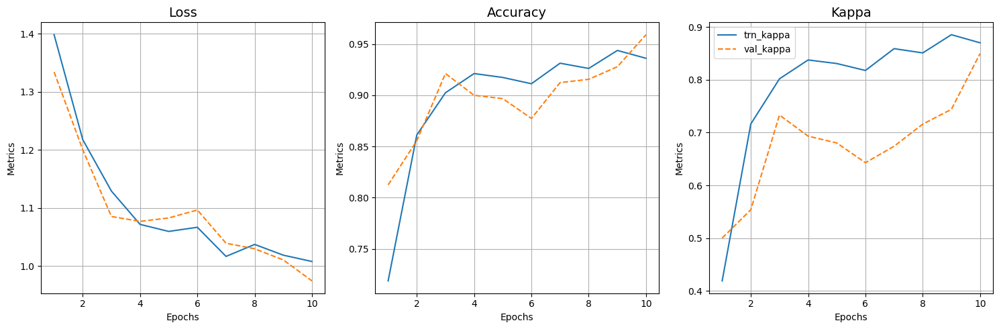

In [31]:
plot_results(log)  # plot results

In [32]:
# Test defined in larvae_utils.py
model_name = 'ResNet50'
(loss, acc, kappa) = Test(model, testload, criterion, device)

results_resnet = {
    'model': model_name,
    'test_loss': loss,
    'test_accuracy': acc,
    'test_kappa': kappa,
    'training_time': training_time,
    'total_parameters': sum(p.numel() for p in model.parameters() if p.requires_grad)
}

results_pretained.append(results_resnet)
trained_logs[model_name] = log
trained_models[model_name] = model

results_resnet

{'model': 'ResNet50',
 'test_loss': 0.9991200884183248,
 'test_accuracy': 0.93125,
 'test_kappa': np.float64(0.7557133873268977),
 'training_time': 111.40740585327148,
 'total_parameters': 262530}

In [57]:
# save model
torch.save(trained_models['ResNet50'].state_dict(), f'trained_models/ResNet50_pretained.pth')

In [34]:
df_results_pretrained = pd.DataFrame(results_pretained)
df_results_pretrained

,model,test_loss,test_accuracy,test_kappa,training_time,total_parameters
0,VGG16,0.47573,0.92500,0.750090,142.709517,65922
1,ResNet50,0.99912,0.93125,0.755713,111.407406,262530


In [35]:
df_results_pretrained.to_csv('trained_models/results_pretained.csv', index=False)

## Compara resultados

In [ ]:
results_scratch = pd.read_csv('trained_models/results_scratch.csv')  # load results from scratch models
results_scratch

,model,test_loss,test_accuracy,test_kappa,training_time,total_parameters
0,Residual+Inception+SE,1.836819,0.968750,0.875339,713.161165,7411202
1,Residual+Inception,1.883032,0.962500,0.851552,801.493583,7409154
2,Residual,1.556458,0.889583,0.633842,655.143735,51596098
3,Baseline,1.362007,0.837500,0.506361,491.048076,51588194


In [125]:
all_results = pd.concat([results_scratch, df_results_pretrained], ignore_index=True)
all_results.sort_values(by='test_kappa', ascending=False, inplace=True)
all_results

,model,test_loss,test_accuracy,test_kappa,training_time,total_parameters
0,Residual+Inception+SE,1.836819,0.968750,0.875339,713.161165,7411202
1,Residual+Inception,1.883032,0.962500,0.851552,801.493583,7409154
5,ResNet50,0.999120,0.931250,0.755713,111.407406,262530
4,VGG16,0.475730,0.925000,0.750090,142.709517,65922
2,Residual,1.556458,0.889583,0.633842,655.143735,51596098
3,Baseline,1.362007,0.837500,0.506361,491.048076,51588194


In [ ]:
all_results.to_csv('trained_models/all_results.csv', index=False)  # save all results

# Vizualizar projeções redes pre-treinadas

In [55]:
# import umap and t-sne
import umap.umap_ as umap
from sklearn.manifold import TSNE
from numpy import broadcast_to

## VGG16

In [56]:
# Função para obter os outputs de cada camada do modelo VGG16
def get_layer_outputs_vgg(model, x):
    # empty dict
    output_by_layer = OrderedDict()

    # get input
    output_by_layer['input'] = x.clone().detach().cpu().numpy()

    # get features layers from vgg16
    for layer_name, layer in model.features.named_children():
        x = layer(x)
        output_by_layer['vgg16'+layer_name] = x.clone().detach().cpu().numpy()

    # get avgpool layer
    x = model.avgpool(x)
    output_by_layer['avgpool'] = x.clone().detach().cpu().numpy()

    # get classifier layers
    for layer_name, layer in model.classifier.named_children():
        x = layer(x)
        output_by_layer['classifier'+layer_name] = x.clone().detach().cpu().numpy()

    return output_by_layer

In [59]:
model_vgg16 = trained_models['VGG16'].to(device)

In [37]:
len(trainset), len(validload), len(testload)  # number of batches in each dataloader

(25, 10, 15)

In [60]:
# get the output of each layer
# usei validload por ser menor
# testar testload (nao rolou, estourou kernel)
outputs_by_layer, all_labels = get_ouputs(model_vgg16, validload, device, get_outputs_function=get_layer_outputs_vgg)

In [61]:
from sklearn.decomposition import PCA

# função para criar projeção usando PCA
# recebe os outputs de cada camada e um objeto PCA
# retorna um dicionário com as projeções de cada camada
# se o número de features for maior que 100, aplica PCA antes do reducer, ficando com no máximo 50 features (reduzidas por PCA)
# tive que usar como alternativa, pois as projeções da TSNE estavam estourando a memória da minha máquina
def projection_with_pca(outputs_by_layer, reducer):
    projections = {}
    for layer, feats in outputs_by_layer.items():
        feats_flat = feats.reshape(feats.shape[0], -1)
        # PCA antes do reducer
        if feats_flat.shape[1] > 100:
            feats_flat = PCA(n_components=50).fit_transform(feats_flat)
        projections[layer] = reducer.fit_transform(feats_flat)
    return projections

In [62]:
# get tsne projection
reducer = TSNE(perplexity=20)
projection_by_layer_tsne = projection_with_pca(outputs_by_layer, reducer)

In [63]:
# get umap projection
reducer = umap.UMAP()
projection_by_layer_umap = projection_with_pca(outputs_by_layer, reducer)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [64]:
# save projections
with open('projections/vgg16_pretained/projection_by_layer_tsne.pkl', 'wb') as f:
    pickle.dump(projection_by_layer_tsne, f)

with open('projections/vgg16_pretained/projection_by_layer_umap.pkl', 'wb') as f:    
    pickle.dump(projection_by_layer_umap, f)

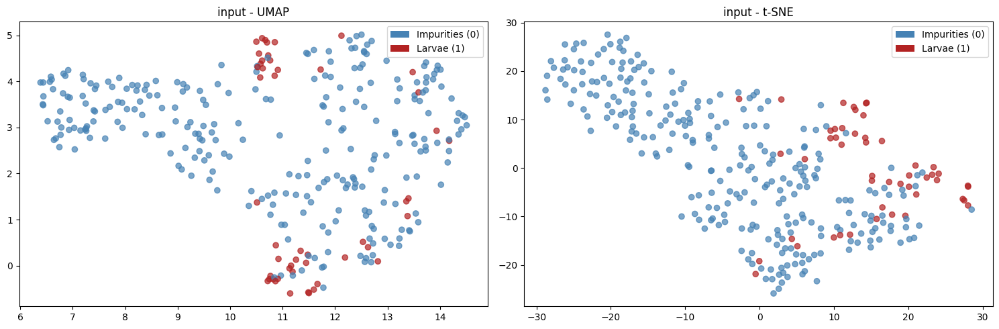

Saved projection_input.png


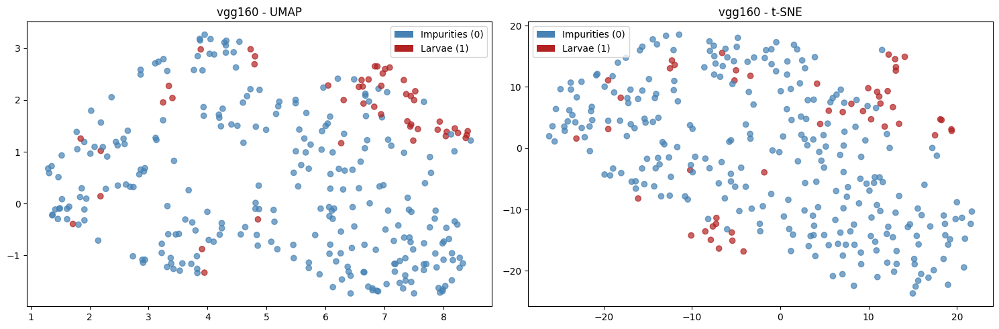

Saved projection_vgg160.png


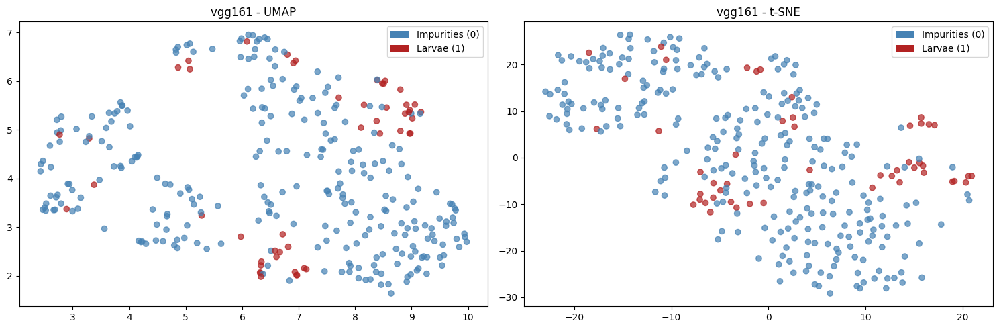

Saved projection_vgg161.png


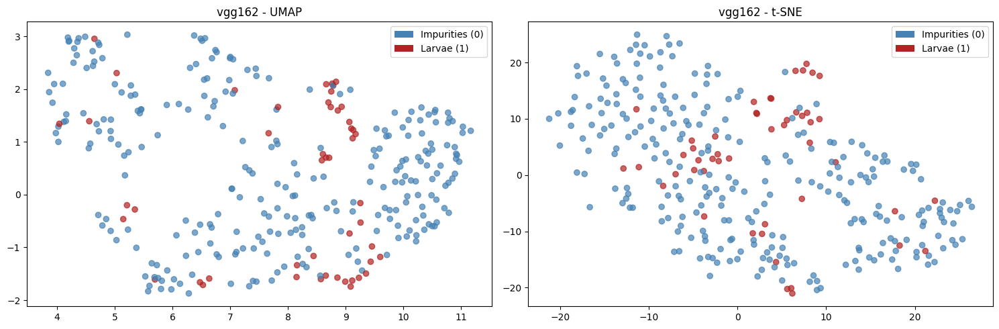

Saved projection_vgg162.png


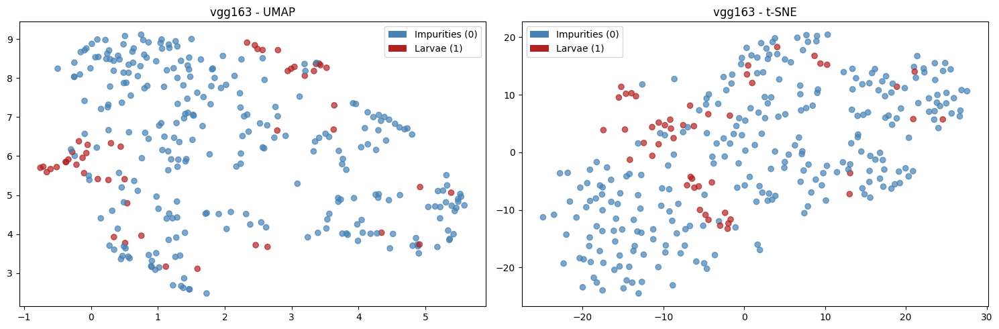

Saved projection_vgg163.png


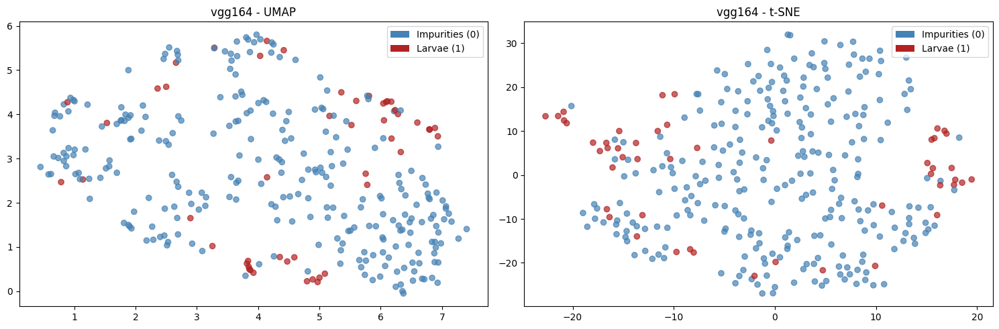

Saved projection_vgg164.png


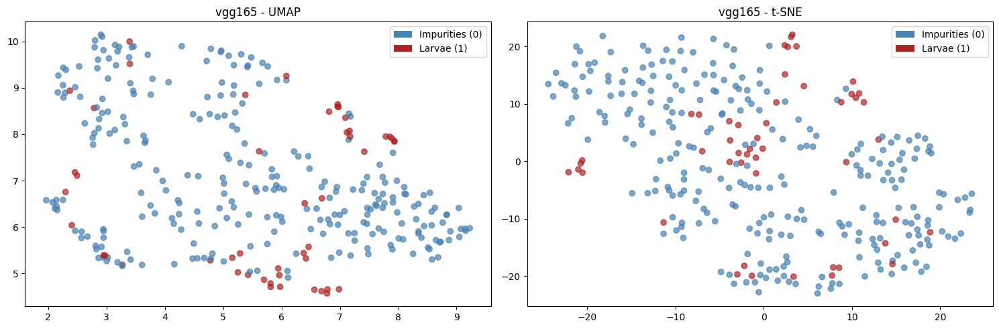

Saved projection_vgg165.png


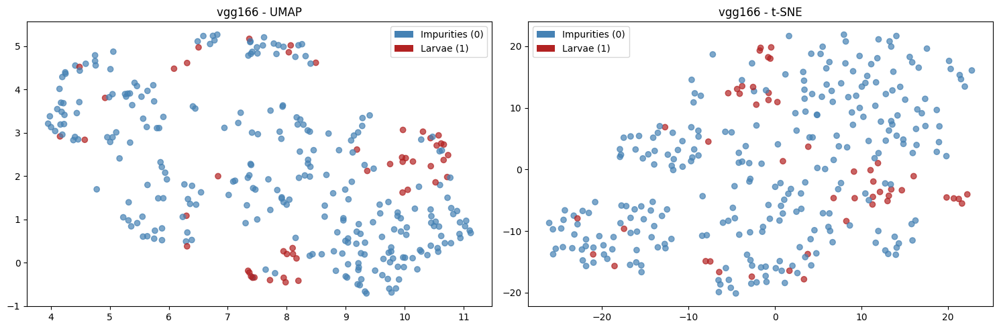

Saved projection_vgg166.png


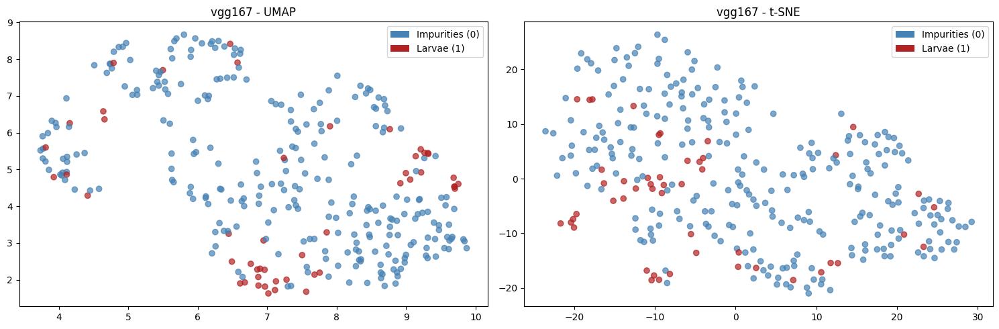

Saved projection_vgg167.png


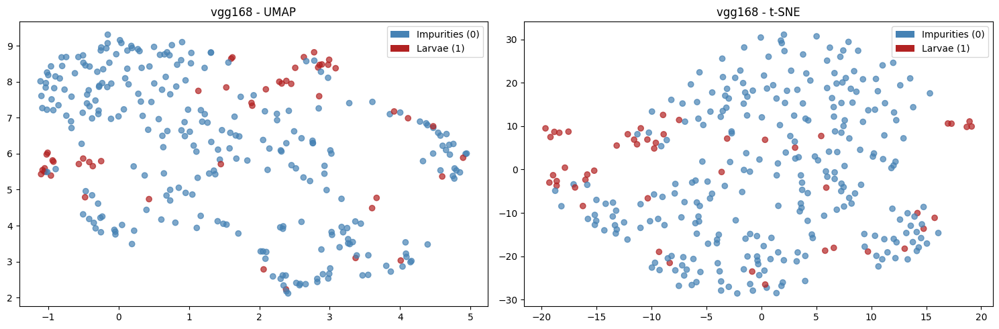

Saved projection_vgg168.png


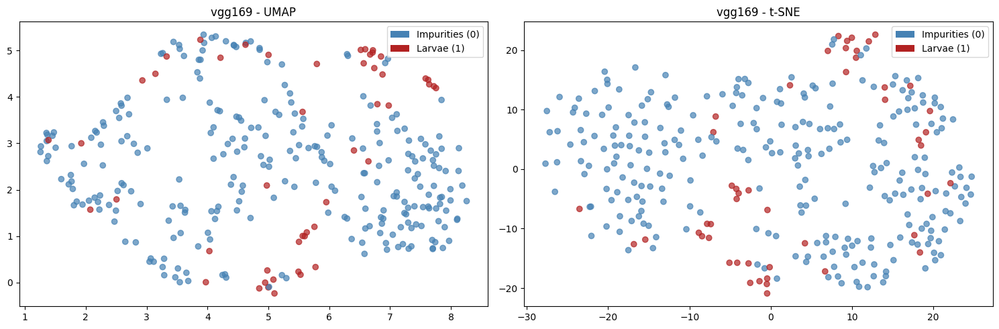

Saved projection_vgg169.png


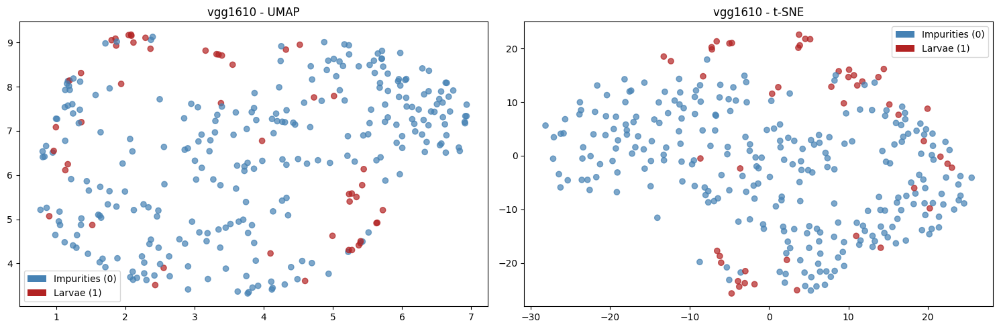

Saved projection_vgg1610.png


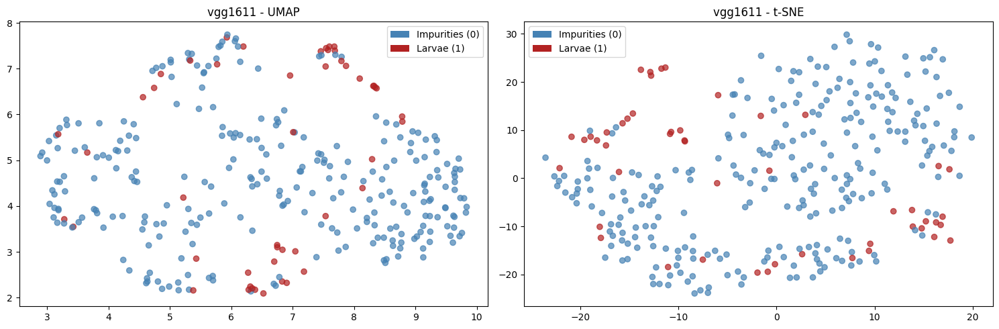

Saved projection_vgg1611.png


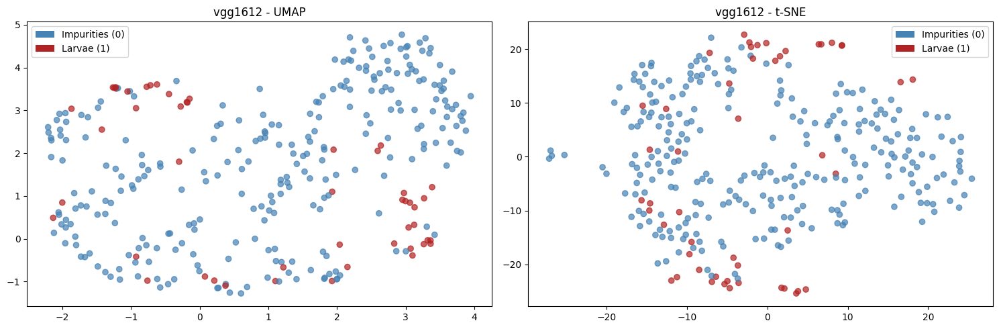

Saved projection_vgg1612.png


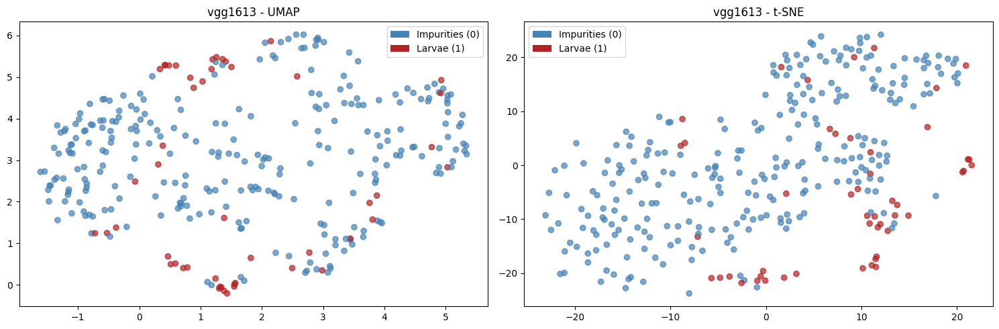

Saved projection_vgg1613.png


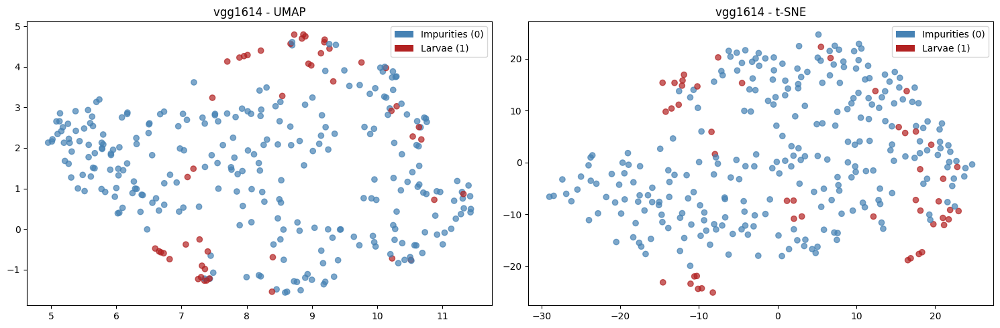

Saved projection_vgg1614.png


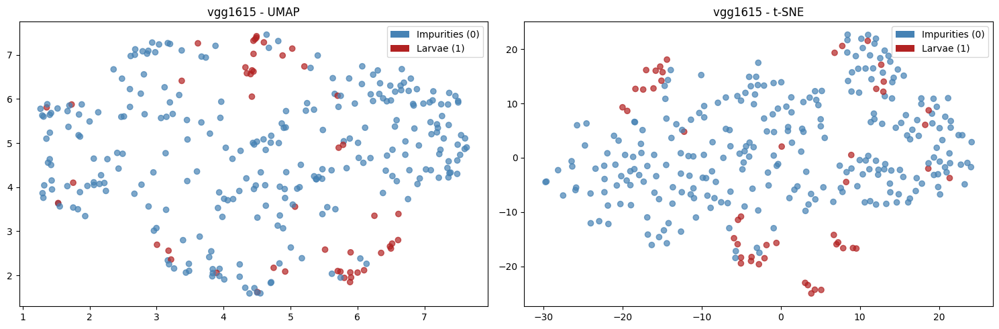

Saved projection_vgg1615.png


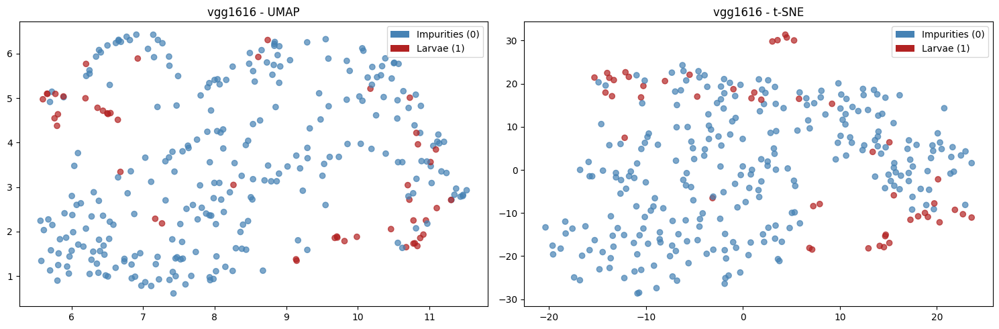

Saved projection_vgg1616.png


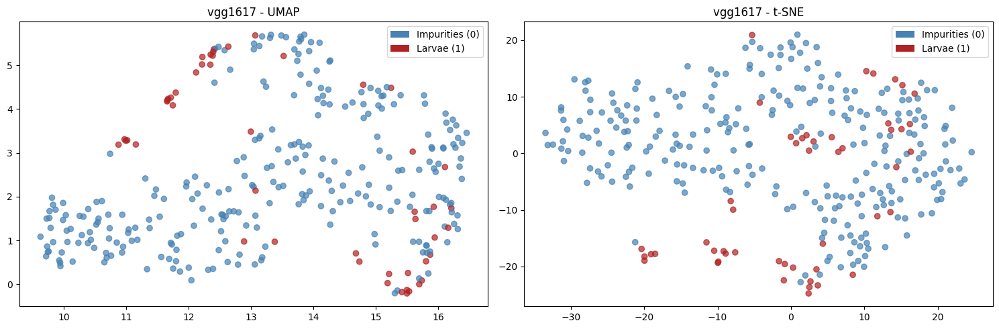

Saved projection_vgg1617.png


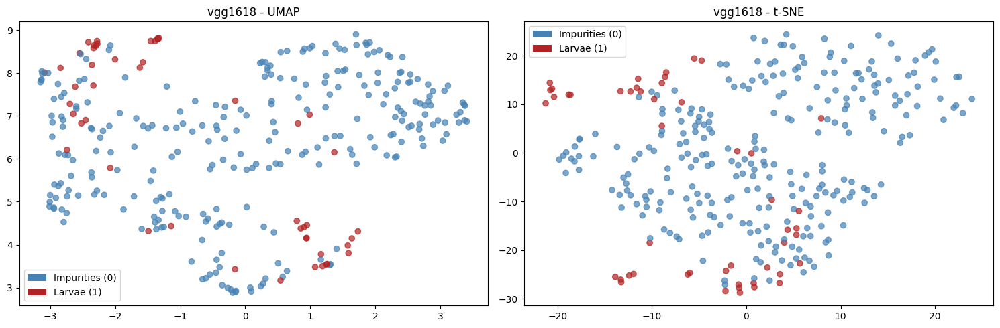

Saved projection_vgg1618.png


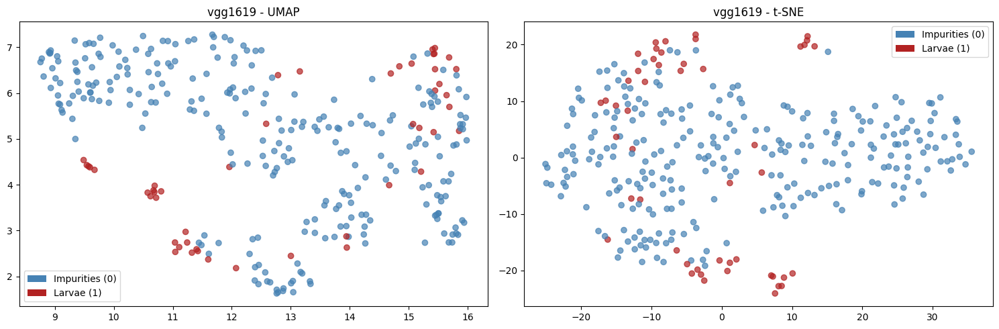

Saved projection_vgg1619.png


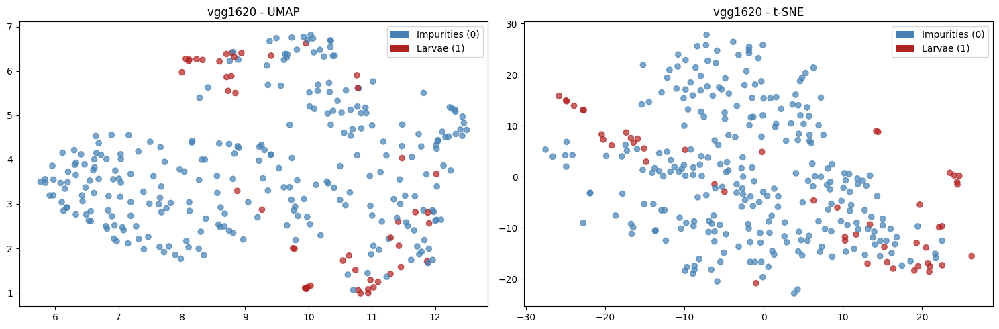

Saved projection_vgg1620.png


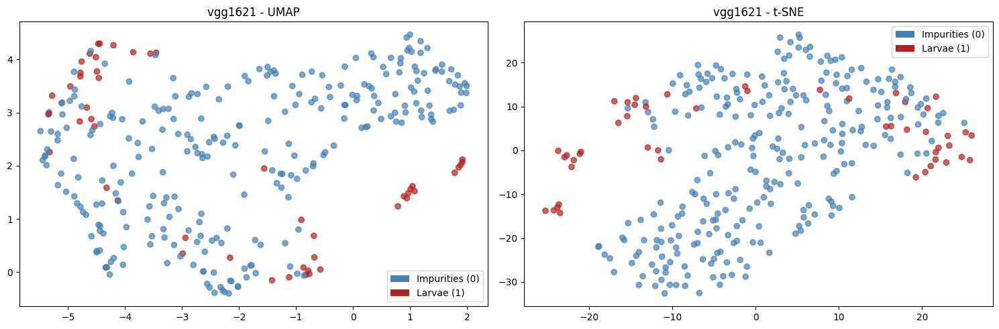

Saved projection_vgg1621.png


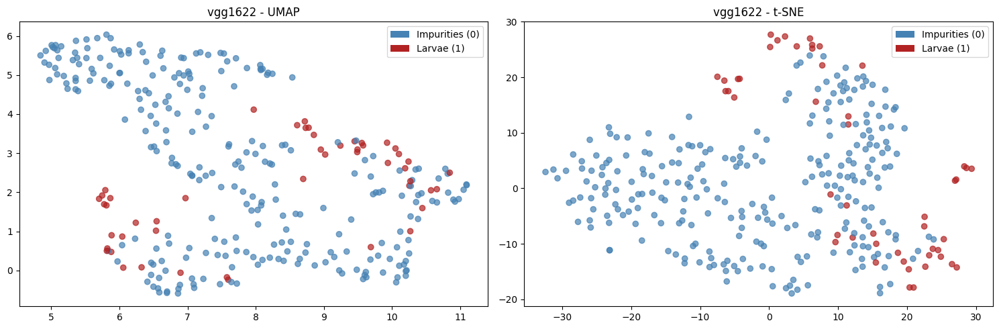

Saved projection_vgg1622.png


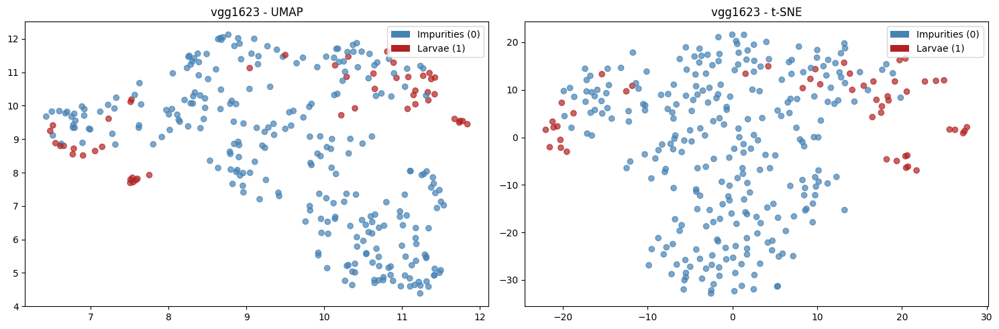

Saved projection_vgg1623.png


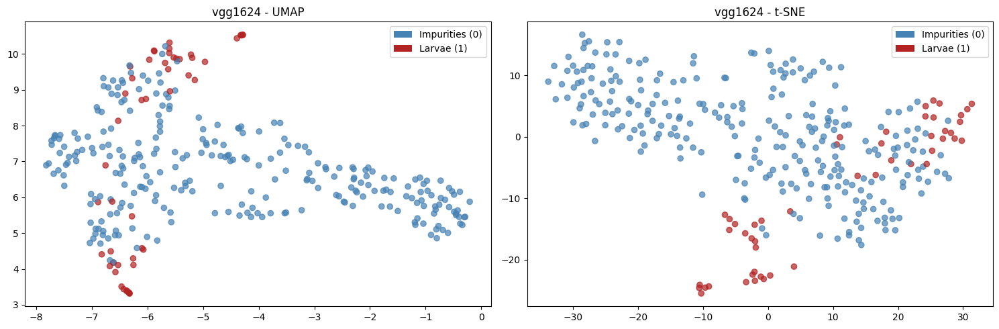

Saved projection_vgg1624.png


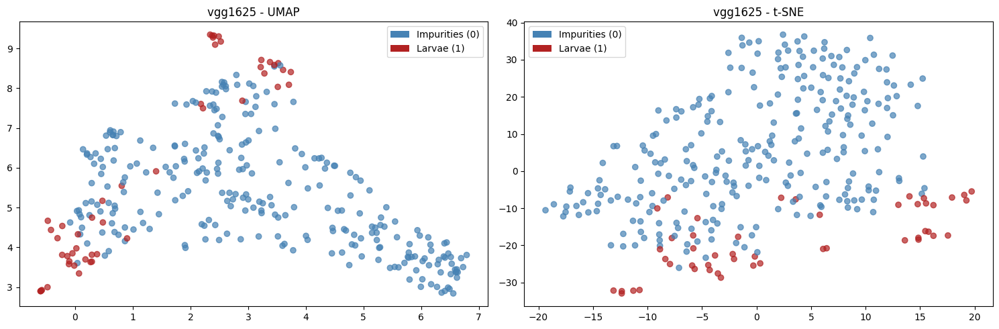

Saved projection_vgg1625.png


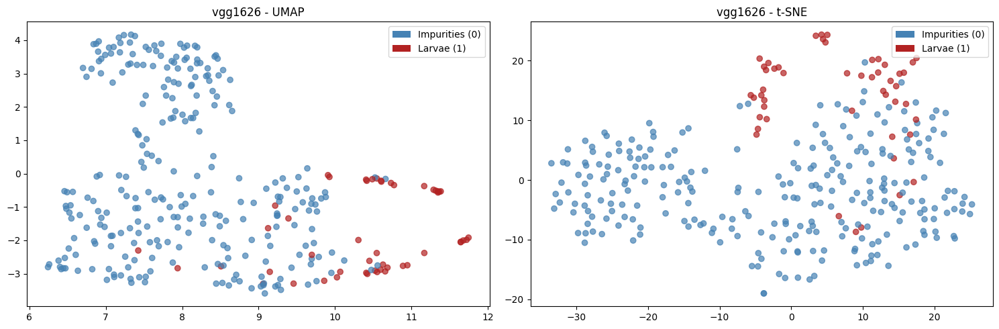

Saved projection_vgg1626.png


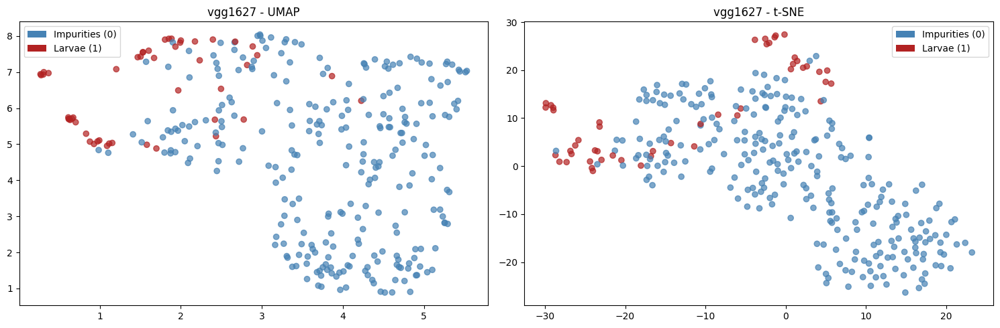

Saved projection_vgg1627.png


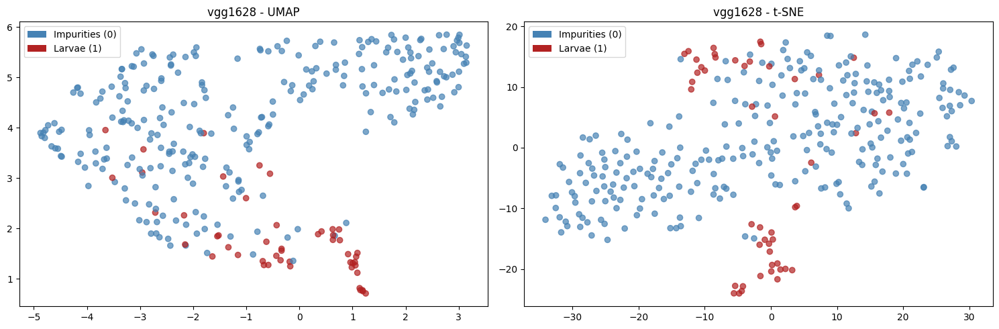

Saved projection_vgg1628.png


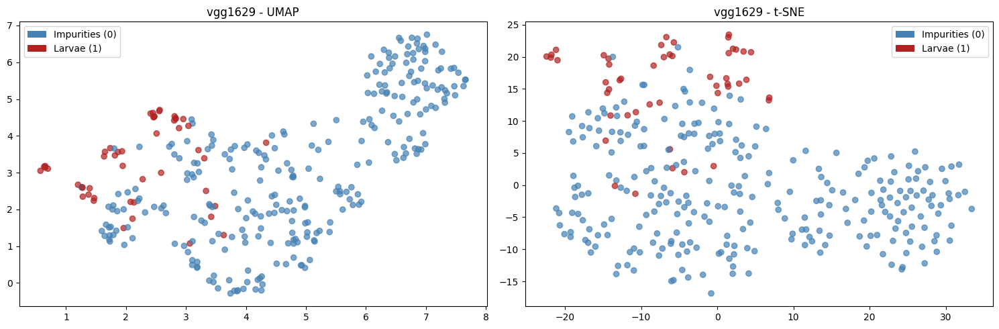

Saved projection_vgg1629.png


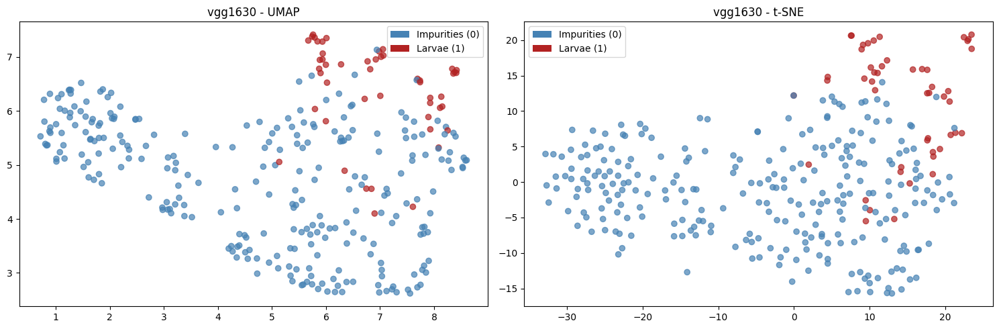

Saved projection_vgg1630.png


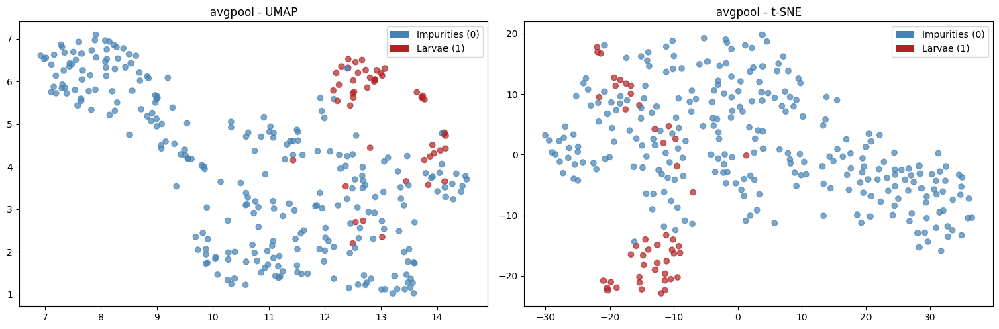

Saved projection_avgpool.png


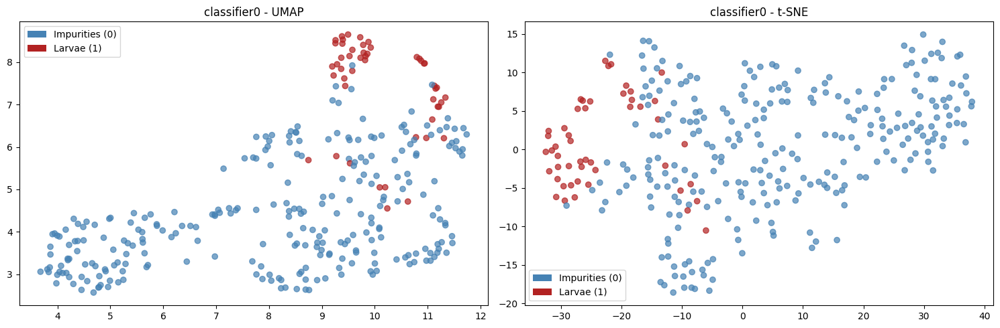

Saved projection_classifier0.png


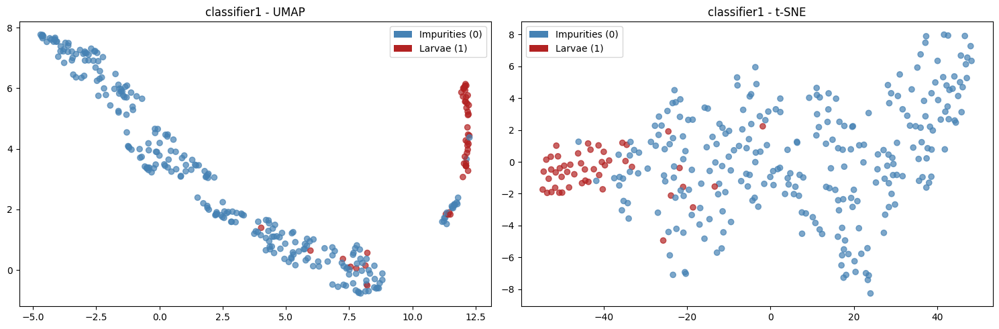

Saved projection_classifier1.png


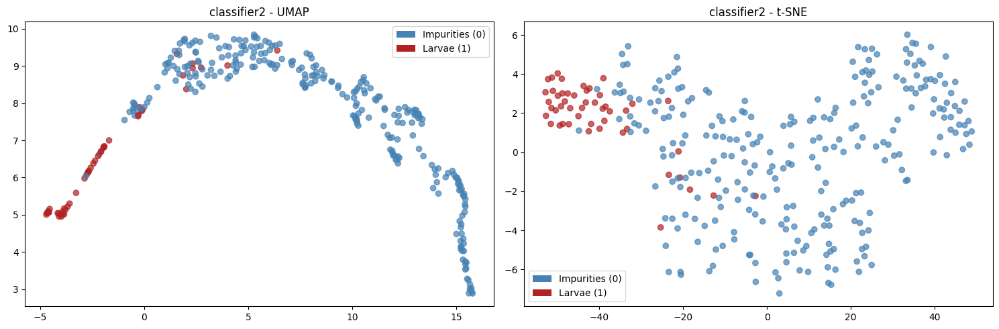

Saved projection_classifier2.png


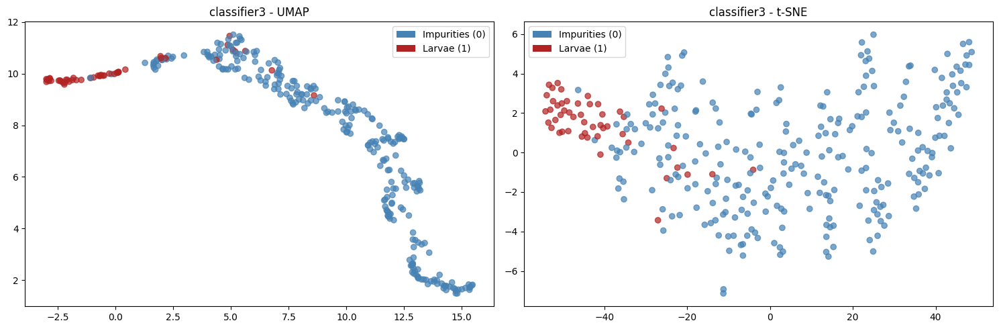

Saved projection_classifier3.png


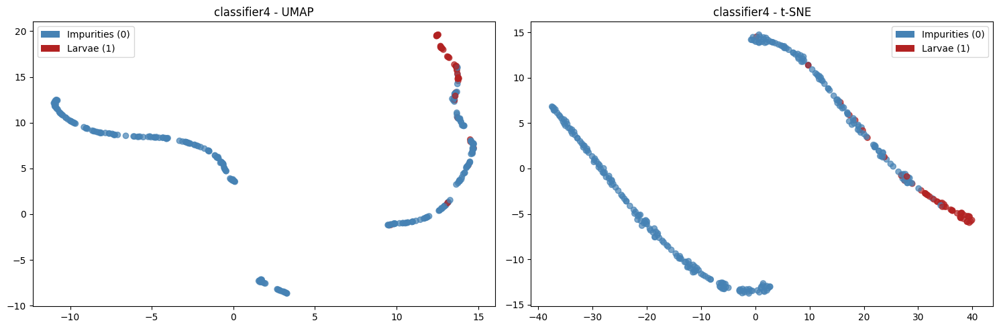

Saved projection_classifier4.png


In [65]:
# visualize the projection of the output of each layer
create_visualization(projection_by_layer_umap, projection_by_layer_tsne, all_labels, 
                     save_img=True, save_dict='projections/vgg16_pretained')  

## ResNet50

In [66]:
# Função para obter os outputs de cada camada do modelo ResNet50
def get_layer_outputs_resnet(model, x):
    # empty dict
    output_by_layer = OrderedDict()

    # get input
    output_by_layer['input'] = x.clone().detach().cpu().numpy()

    # ResNet initial layers
    x = model.conv1(x)
    output_by_layer['conv1'] = x.clone().detach().cpu().numpy()
    
    x = model.bn1(x)
    x = model.relu(x)
    x = model.maxpool(x)
    output_by_layer['initial_block'] = x.clone().detach().cpu().numpy()

    # ResNet residual blocks
    x = model.layer1(x)
    output_by_layer['layer1'] = x.clone().detach().cpu().numpy()
    
    x = model.layer2(x)
    output_by_layer['layer2'] = x.clone().detach().cpu().numpy()
    
    x = model.layer3(x)
    output_by_layer['layer3'] = x.clone().detach().cpu().numpy()
    
    x = model.layer4(x)
    output_by_layer['layer4'] = x.clone().detach().cpu().numpy()

    # Average pooling
    x = model.avgpool(x)
    output_by_layer['avgpool'] = x.clone().detach().cpu().numpy()

    # Fully connected layers
    x = torch.flatten(x, 1)  # ResNet needs explicit flattening
    for layer_name, layer in model.fc.named_children():
        x = layer(x)
        output_by_layer['fc_' + layer_name] = x.clone().detach().cpu().numpy()

    return output_by_layer

In [67]:
model = trained_models['ResNet50'].to(device)

In [68]:
# get the output of each layer
outputs_by_layer_resnet, all_labels_resnet = get_ouputs(model_resnet, validload, device, get_outputs_function=get_layer_outputs_resnet)

In [69]:
# get tsne projection
reducer = TSNE(perplexity=20)
projection_by_layer_tsne_resnet = projection_with_pca(outputs_by_layer_resnet, reducer)

In [70]:
# get umap projection
reducer = umap.UMAP()
projection_by_layer_umap_resnet = projection_with_pca(outputs_by_layer_resnet, reducer)

In [71]:
# save projections
with open('projections/ResNet50_pretained/projection_by_layer_tsne_resnet.pkl', 'wb') as f:
    pickle.dump(projection_by_layer_tsne, f)

with open('projections/ResNet50_pretained/projection_by_layer_umap_resnet.pkl', 'wb') as f:    
    pickle.dump(projection_by_layer_umap, f)

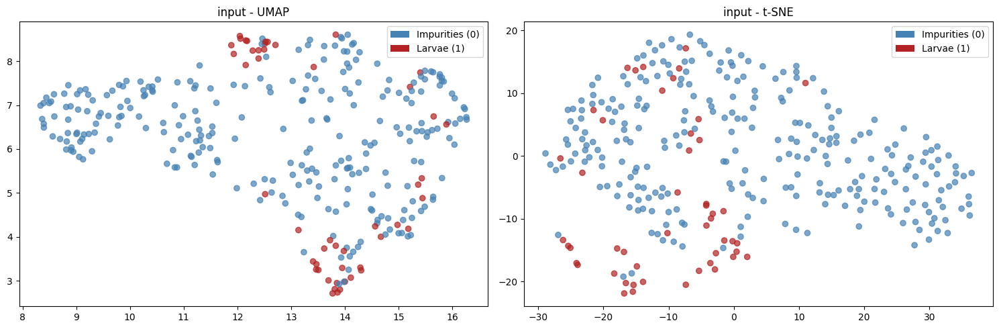

Saved projection_input.png


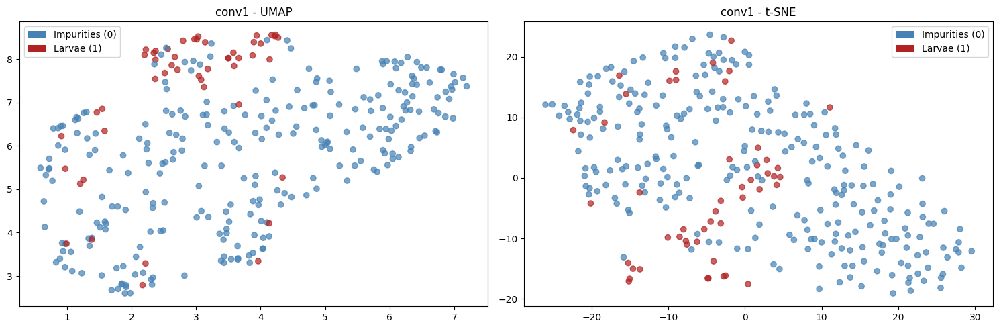

Saved projection_conv1.png


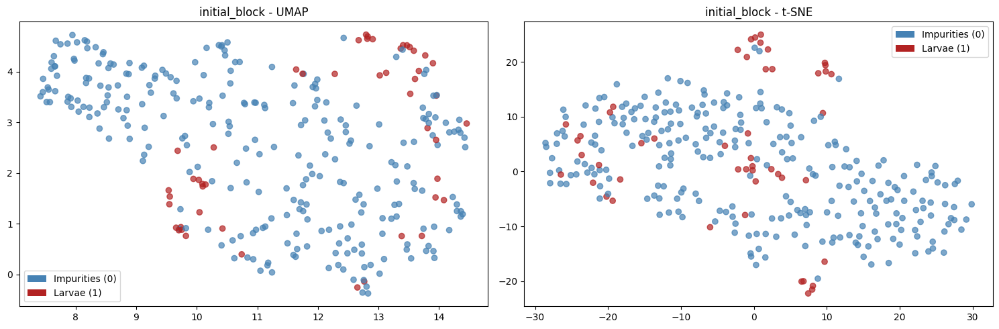

Saved projection_initial_block.png


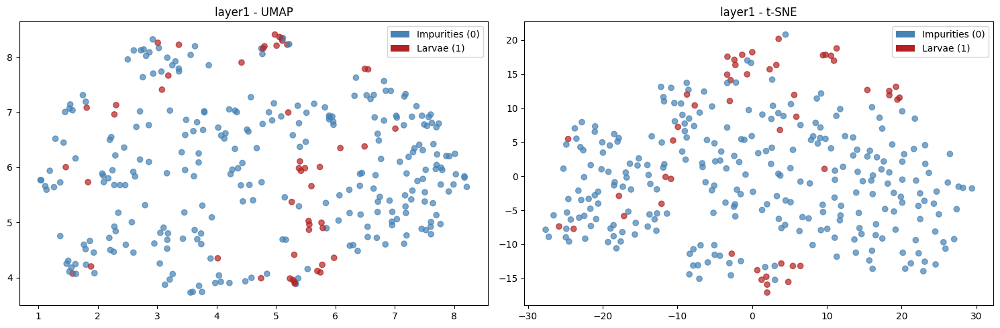

Saved projection_layer1.png


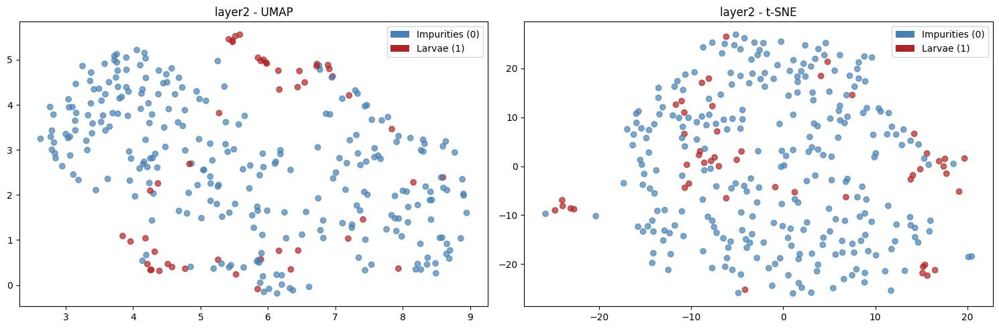

Saved projection_layer2.png


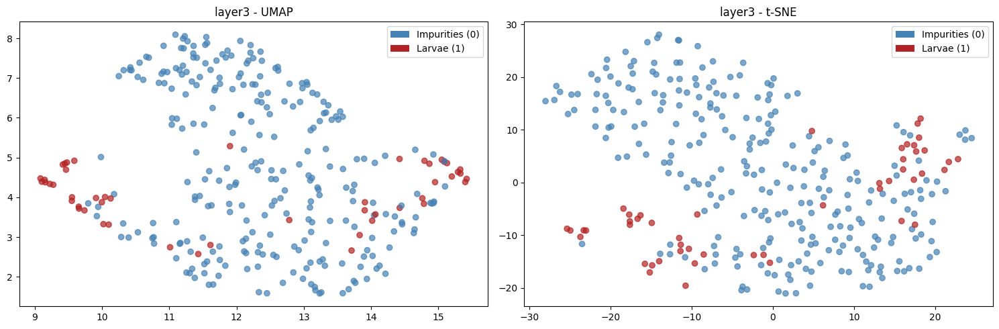

Saved projection_layer3.png


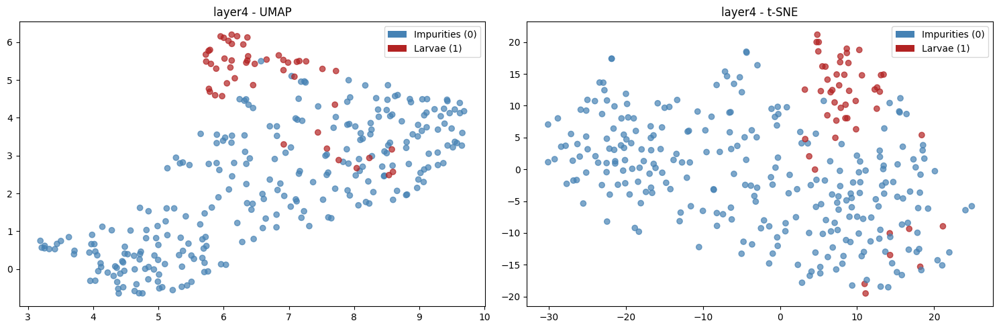

Saved projection_layer4.png


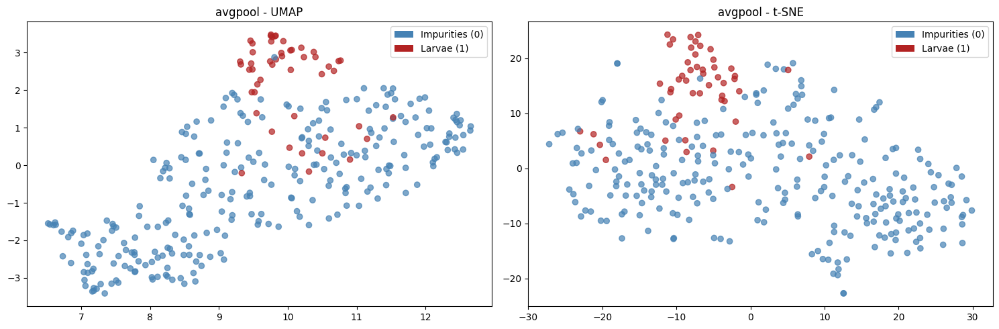

Saved projection_avgpool.png


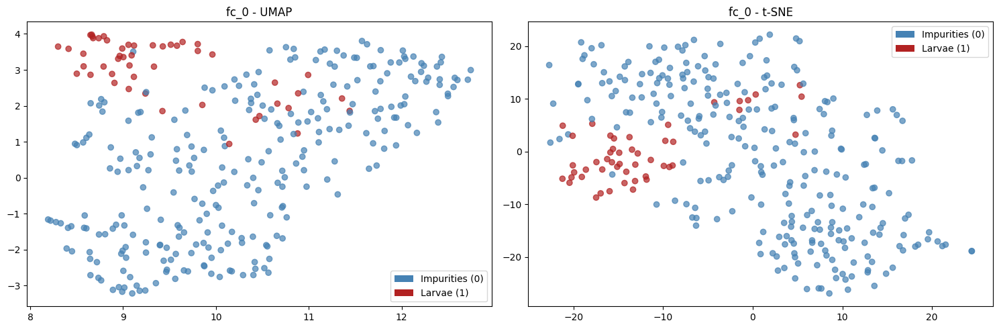

Saved projection_fc_0.png


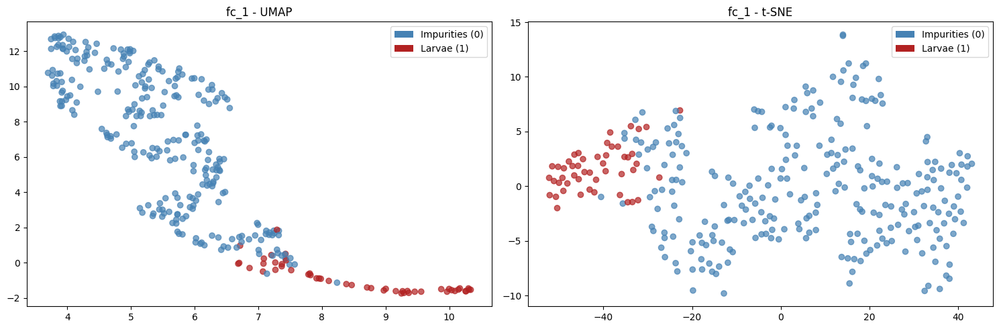

Saved projection_fc_1.png


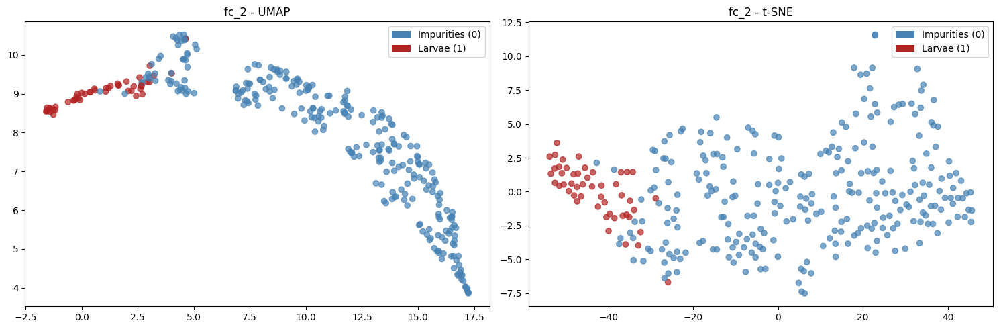

Saved projection_fc_2.png


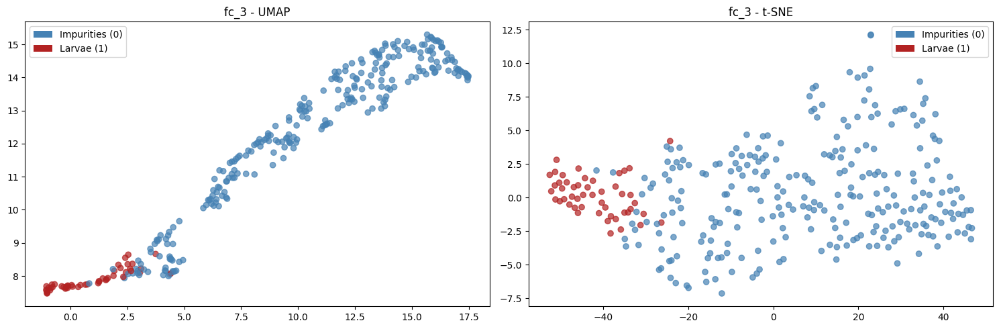

Saved projection_fc_3.png


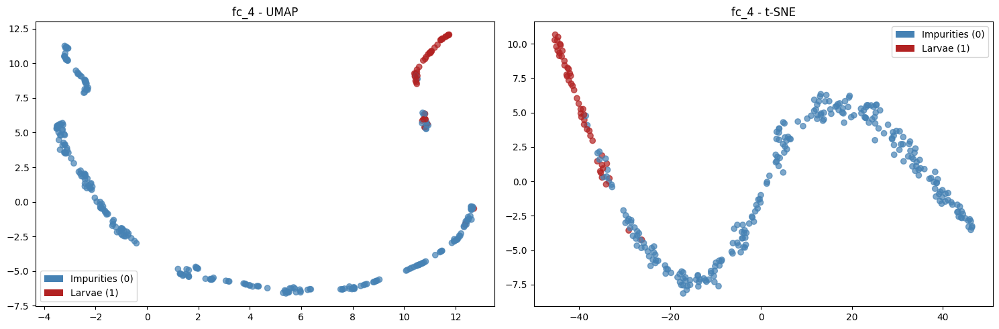

Saved projection_fc_4.png


In [72]:
# visualize the projection of the output of each layer
create_visualization(projection_by_layer_umap_resnet, projection_by_layer_tsne_resnet, all_labels_resnet, 
                     save_img=True, save_dict='projections/ResNet50_pretained')

# Regiões de atenção

In [73]:
import torch.nn.functional as F

## VGG16

In [74]:
# Percorre validset_, salva o target correto, a predição do modelo e o índice
model = trained_models['VGG16']
model.eval()
targets_true = []
preds_model = []
indices = []
img_paths = []

with torch.no_grad():
    for idx, (img, target) in enumerate(validset):
        img = img.unsqueeze(0).to(device)
        output = model(img)
        pred = torch.argmax(output, dim=1).item()
        targets_true.append(target)
        preds_model.append(pred)
        indices.append(idx)
        img_paths.append(validset_[idx])

# Criar DataFrame
df_preds = pd.DataFrame({
    'caminho_imagem': img_paths,
    'target_verdadeiro': targets_true,
    'predicao': preds_model,
    'indice': indices
})

df_preds.head()

,caminho_imagem,target_verdadeiro,predicao,indice
0,../../figures-datasets/images/larvae/000002_00...,1,1,0
1,../../figures-datasets/images/larvae/000002_00...,1,1,1
2,../../figures-datasets/images/larvae/000001_00...,0,0,2
3,../../figures-datasets/images/larvae/000001_00...,0,0,3
4,../../figures-datasets/images/larvae/000002_00...,1,1,4


In [ ]:
# indices do primeiro notebook
idx = 2 # exemplo de classificação correta de larva
idx_error = 151 # exemplo de classificação incorreta de larva
idx_resto = 5 # exemplo de classificação correta de resto
idx_error_resto = 0 # exemplo de classificação incorreta de resto

df_preds[df_preds['indice'].isin([idx,idx_error,idx_resto,idx_error_resto])]
# todas passaram a ser classificadas corretamente

,caminho_imagem,target_verdadeiro,predicao,indice
0,../../figures-datasets/images/larvae/000002_00...,1,1,0
2,../../figures-datasets/images/larvae/000001_00...,0,0,2
5,../../figures-datasets/images/larvae/000002_00...,1,1,5
151,../../figures-datasets/images/larvae/000001_00...,0,0,151


In [ ]:
image, target = validset[idx] # get idx th image from trainset
image.size() # it is a tensor with shape (nchannels, height, width)
image = image.unsqueeze(0) # add batch dimension

In [ ]:
image_error, target_error = validset[idx_error] # get idx th image from trainset
image_error.size() # it is a tensor with shape (nchannels, height, width)
image_error = image_error.unsqueeze(0) # add batch dimension

In [ ]:
image_resto, target_resto = validset[idx_resto] # get idx th image from trainset
image_resto.size() # it is a tensor with shape (nchannels, height, width)
image_resto = image_resto.unsqueeze(0) # add batch dimension

In [ ]:
image_error_resto, target_error = validset[idx_error_resto] # get idx th image from trainset
image_error_resto.size() # it is a tensor with shape (nchannels, height, width)
image_error_resto = image_error_resto.unsqueeze(0) # add batch dimension

In [80]:
# Função para gerar GradCAM
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]
        
    def generate_cam(self, input_image, class_idx=None):
        model_output = self.model(input_image)
        if class_idx is None:
            class_idx = torch.argmax(model_output, dim=1)
        self.model.zero_grad()
        class_score = model_output[:, class_idx]
        class_score.backward()
        gradients = self.gradients
        activations = self.activations

        if gradients is None:
            # If gradients are None, we use the last activation map
            cam = torch.mean(activations, dim=1)[0].cpu().detach()
        else:
            weights = torch.mean(gradients, dim=[2, 3])
            cam = torch.zeros(activations.shape[2:], dtype=torch.float32).to(input_image.device)
            for i, w in enumerate(weights[0]):
                cam += w * activations[0, i, :, :]

        cam = F.relu(cam)
        cam = cam - torch.min(cam)
        cam = cam / (torch.max(cam) + 1e-8)
        return cam.detach().cpu().numpy()

# Função para gerar GradCAM para um modelo customizado
def gradcam_custom_model(model, image, target_layer_name):
    target_layer = dict(model.named_modules())[target_layer_name]
    grad_cam = GradCAM(model, target_layer)
    cam = grad_cam.generate_cam(image)
    return cam

# Função para visualizar GradCAM
def visualize_gradcam(orig_image, cam, alpha=0.4):
    cam_resized = cv2.resize(cam, (orig_image.shape[1], orig_image.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlayed = heatmap * alpha + orig_image * (1 - alpha)
    overlayed = 255*(overlayed - np.min(overlayed)) / (np.max(overlayed)-np.min(overlayed) + 1e-8)
    overlayed = overlayed.astype('uint8')

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(orig_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    
    axes[1].imshow(heatmap)
    axes[1].set_title('GradCAM Heatmap')
    axes[1].axis('off')
    
    axes[2].imshow(overlayed.astype(np.uint8))
    axes[2].set_title('Overlayed Result')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

    return overlayed, heatmap


In [81]:
conv2d_last_block = model.features[28] # get last conv block from vgg
for name, module in model.named_modules():
    if module is conv2d_last_block:
        target_layer_name = name
        break

# Generate GradCAM for 
# image = exemplo de classificação correta de larva
cam = gradcam_custom_model(model, image.to(device), target_layer_name)
# image_error = exemplo de classificação incorreta de larva
cam_error = gradcam_custom_model(model, image_error.to(device), target_layer_name)
# image_resto = exemplo de classificação correta de resto
cam_resto = gradcam_custom_model(model, image_resto.to(device), target_layer_name)
# image_error_resto = exemplo de classificação incorreta de resto
cam_error_resto = gradcam_custom_model(model, image_error_resto.to(device), target_layer_name)

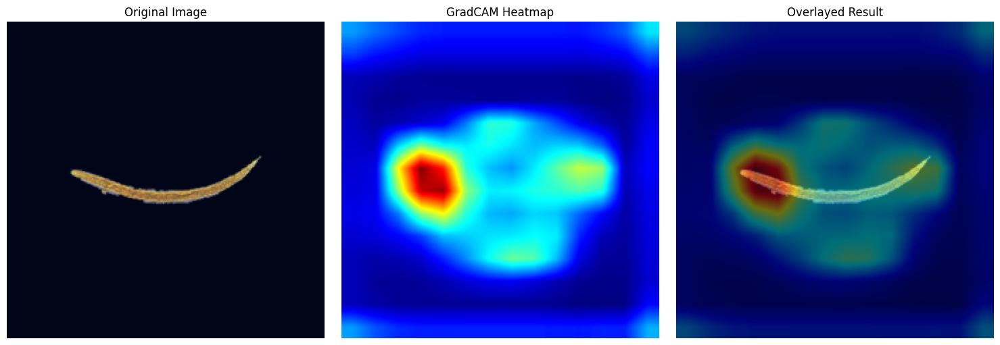

In [82]:
orig_image, target = validset[idx]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam, alpha=0.4)

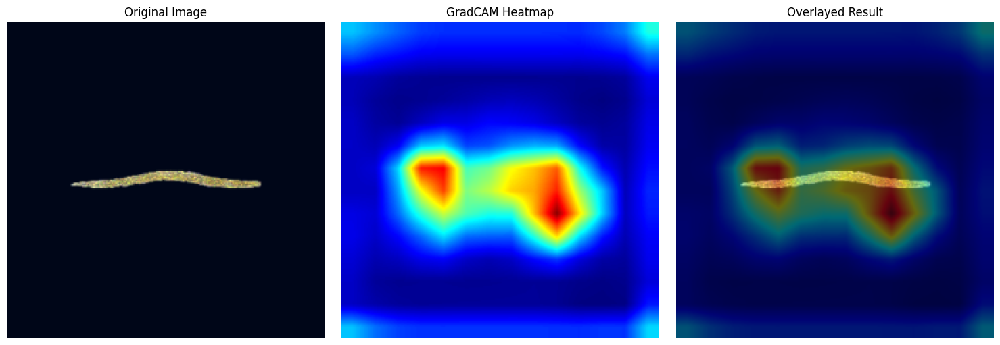

In [ ]:
orig_image, target = validset[idx_error]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam_error, alpha=0.4)
# a região da larva está mais clara, indicando que o modelo está prestando atenção nessa região
# passou a conseguir captar essa regiao mesmo com a larva esticada

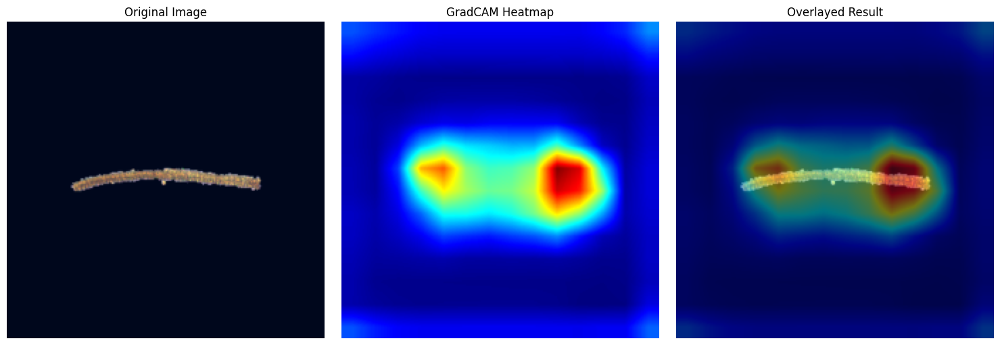

In [85]:
orig_image, target = validset[idx_resto]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam_resto, alpha=0.4)

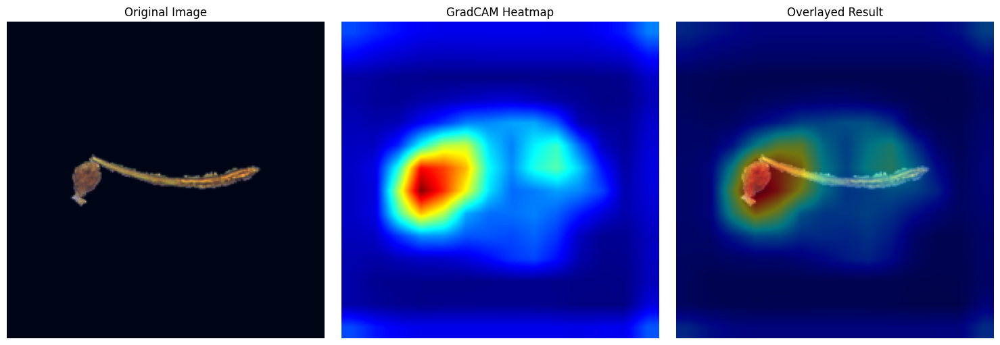

In [86]:
orig_image, target = validset[idx_error_resto]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam_error_resto, alpha=0.4)

## ResNet50

In [97]:
# Percorre validset_, salva o target correto, a predição do modelo e o índice
model = trained_models['ResNet50'].to(device)
model.eval()
targets_true = []
preds_model = []
indices = []
img_paths = []

with torch.no_grad():
    for idx, (img, target) in enumerate(validset):
        img = img.unsqueeze(0).to(device)
        output = model(img)
        pred = torch.argmax(output, dim=1).item()
        targets_true.append(target)
        preds_model.append(pred)
        indices.append(idx)
        img_paths.append(validset_[idx])

# Criar DataFrame
df_preds_resnet = pd.DataFrame({
    'caminho_imagem': img_paths,
    'target_verdadeiro': targets_true,
    'predicao': preds_model,
    'indice': indices
})

df_preds_resnet.head()

,caminho_imagem,target_verdadeiro,predicao,indice
0,../../figures-datasets/images/larvae/000002_00...,1,1,0
1,../../figures-datasets/images/larvae/000002_00...,1,1,1
2,../../figures-datasets/images/larvae/000001_00...,0,0,2
3,../../figures-datasets/images/larvae/000001_00...,0,0,3
4,../../figures-datasets/images/larvae/000002_00...,1,1,4


In [98]:
idx = 2 # exemplo de classificação correta de larva
idx_error = 151 # exemplo de classificação incorreta de larva
idx_resto = 5 # exemplo de classificação correta de resto
idx_error_resto = 0 # exemplo de classificação incorreta de resto

df_preds_resnet[df_preds_resnet['indice'].isin([idx,idx_error,idx_resto,idx_error_resto])]
# todas passaram a ser classificadas corretamente

,caminho_imagem,target_verdadeiro,predicao,indice
0,../../figures-datasets/images/larvae/000002_00...,1,1,0
2,../../figures-datasets/images/larvae/000001_00...,0,0,2
5,../../figures-datasets/images/larvae/000002_00...,1,1,5
151,../../figures-datasets/images/larvae/000001_00...,0,0,151


In [105]:
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [117]:
conv2d_last_block = model.layer4[2].conv3 # get last conv block from resnet
for name, module in model.named_modules():
    if module is conv2d_last_block:
        target_layer_name = name
        break

# Generate GradCAM for 
# image = exemplo de classificação correta de larva
cam = gradcam_custom_model(model, image.to(device), target_layer_name)
# image_error = exemplo de classificação incorreta de larva
cam_error = gradcam_custom_model(model, image_error.to(device), target_layer_name)
# image_resto = exemplo de classificação correta de resto
cam_resto = gradcam_custom_model(model, image_resto.to(device), target_layer_name)
# image_error_resto = exemplo de classificação incorreta de resto
cam_error_resto = gradcam_custom_model(model, image_error_resto.to(device), target_layer_name)

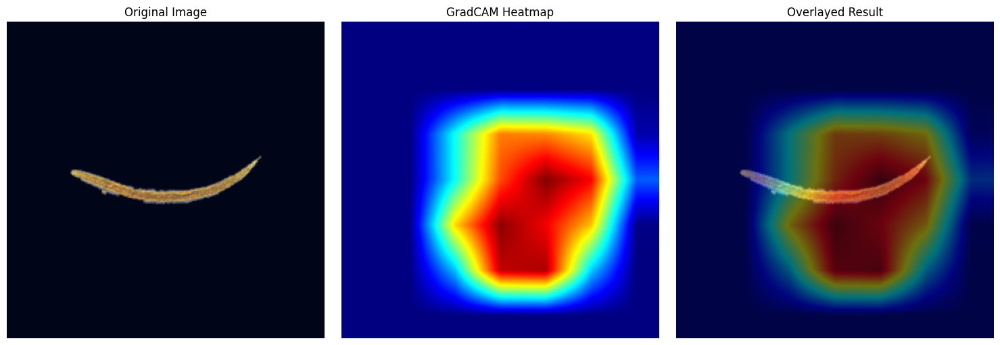

In [118]:
orig_image, target = validset[idx]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam, alpha=0.4)

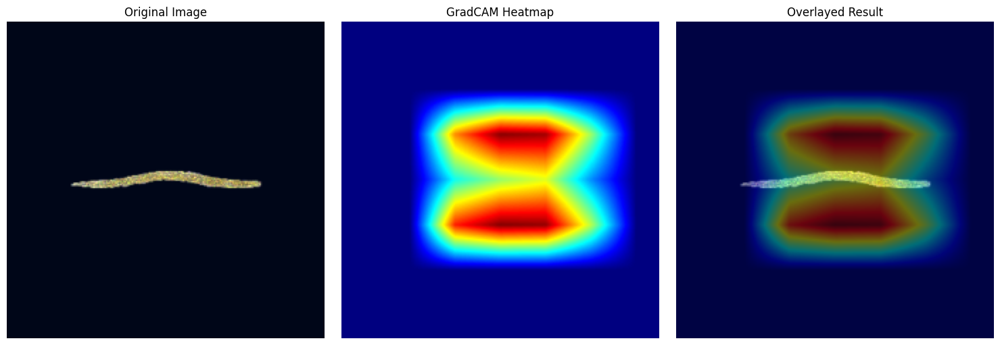

In [119]:
orig_image, target = validset[idx_error]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam_error, alpha=0.4)

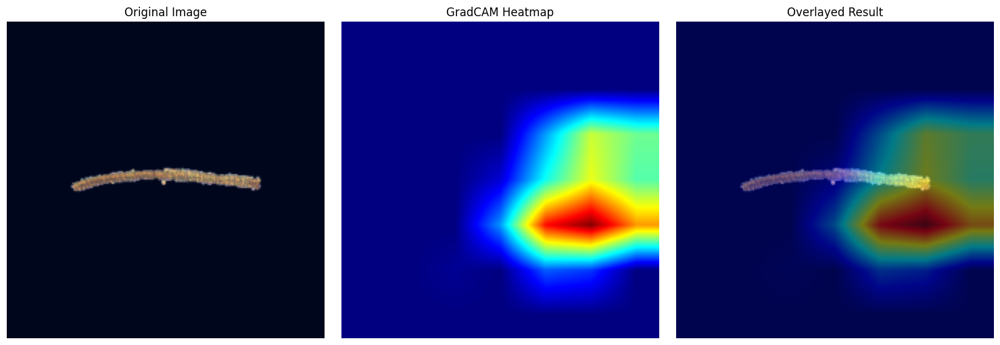

In [120]:
orig_image, target = validset[idx_resto]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam_resto, alpha=0.4)

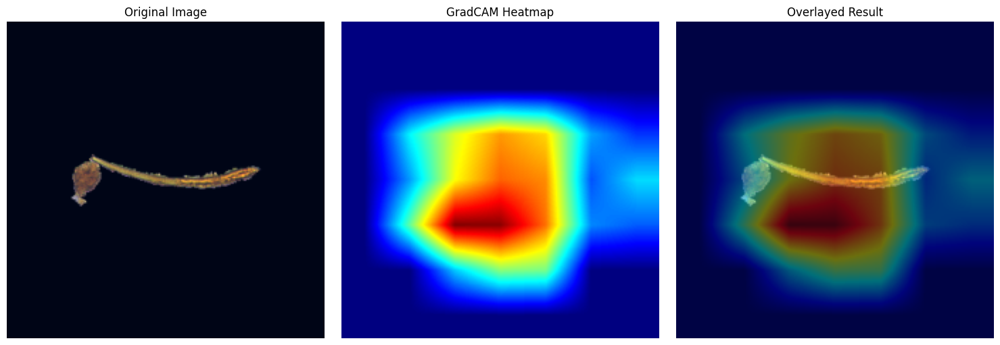

In [121]:
orig_image, target = validset[idx_error_resto]  
orig_image = orig_image.permute(1, 2, 0).numpy()
orig_image = 255*(orig_image - np.min(orig_image)) / (np.max(orig_image)-np.min(orig_image))
orig_image = orig_image.astype('uint8')
overlayed, heatmap = visualize_gradcam(orig_image, cam_error_resto, alpha=0.4)